In [1]:
from __future__ import print_function, division

import sys
import os

import mir_eval
import librosa
import librosa.display

import scipy 
from scipy.io import wavfile
import matplotlib.pyplot as plt
import IPython.display as ipd
import pandas as pd
import numpy as np 
import pylab

sys.path.append('../scripts')
%matplotlib inline

In [2]:
# Load in data 
y, sr = librosa.load('../data/audio/01_10003_1-04_Shri_Visvanatham.wav', offset=25.0, duration=20)

spectrogram = np.abs(librosa.stft(y))
melspec = librosa.feature.melspectrogram(y=y, sr=sr)
tonnetz = librosa.feature.tonnetz(y=y, sr=sr)

ipd.Audio(y, rate=sr)

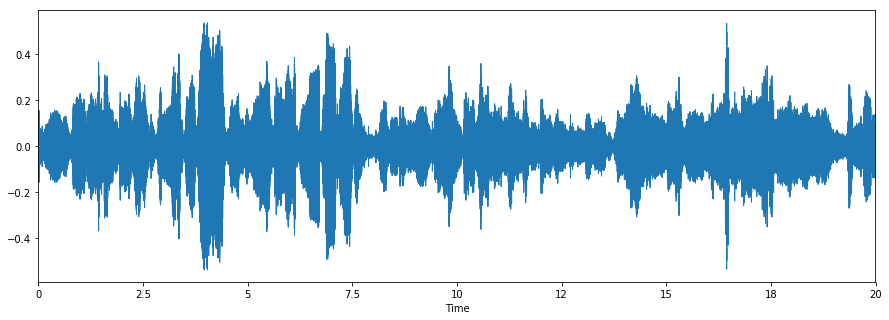

In [3]:
# Plotting a wave form (time axis)
plt.figure(figsize=(15,5))
librosa.display.waveplot(y, sr)

Text(0.5,0,'Frequency (Hz)')

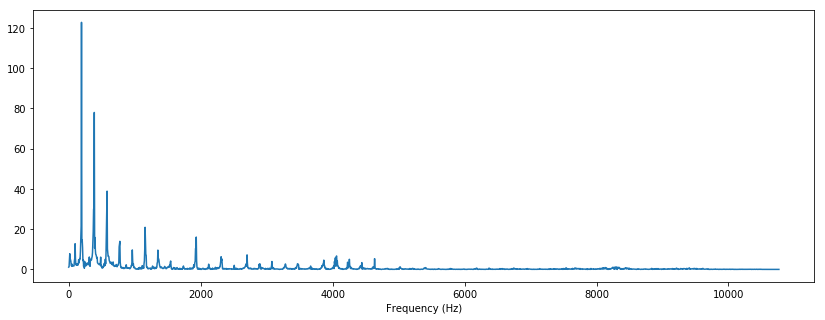

In [4]:
# Apply discrete Fourier transform to the waveform and display the
# relative amplitudes of the partial components 

f = np.linspace(0, sr, 4096)
X = scipy.fft(y[10000:14096])

X_mag = np.absolute(X)

plt.figure(figsize=(14, 5))
plt.plot(f[:2000], X_mag[:2000]) # magnitude spectrum
plt.xlabel('Frequency (Hz)')

c:\users\lexokan\anaconda3\envs\tensorflow\lib\site-packages\librosa\display.py:665: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  warnings.warn('Trying to display complex-valued input. '


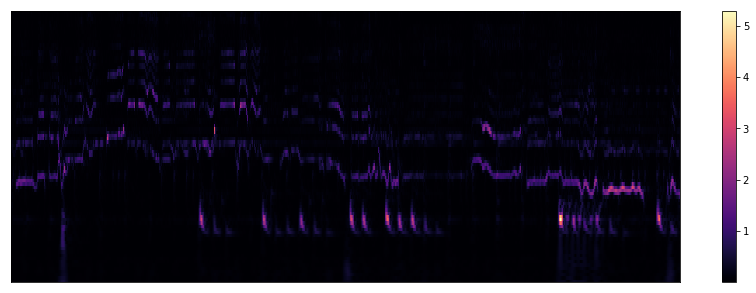

In [5]:
C = librosa.cqt(y, sr)

plt.figure(figsize=(15,5))
librosa.display.specshow(C)
plt.savefig('../figures/CQT.jpg')
plt.colorbar()

c:\users\lexokan\anaconda3\envs\tensorflow\lib\site-packages\librosa\display.py:665: UserWarning: Trying to display complex-valued input. Showing magnitude instead.
  warnings.warn('Trying to display complex-valued input. '


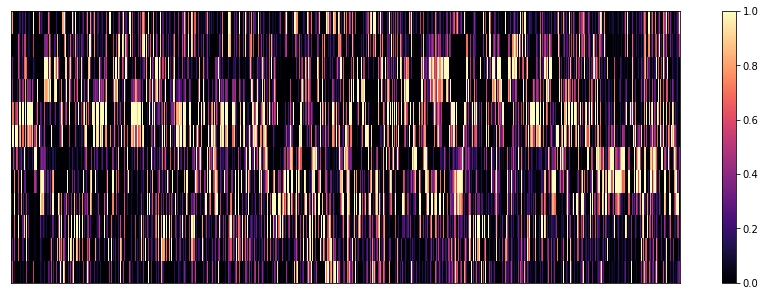

In [6]:
chroma = librosa.feature.chroma_cqt(C=C, sr=sr)

plt.figure(figsize=(15,5))
librosa.display.specshow(chroma)
plt.savefig('../figures/chromaCQT.jpg')
plt.colorbar()

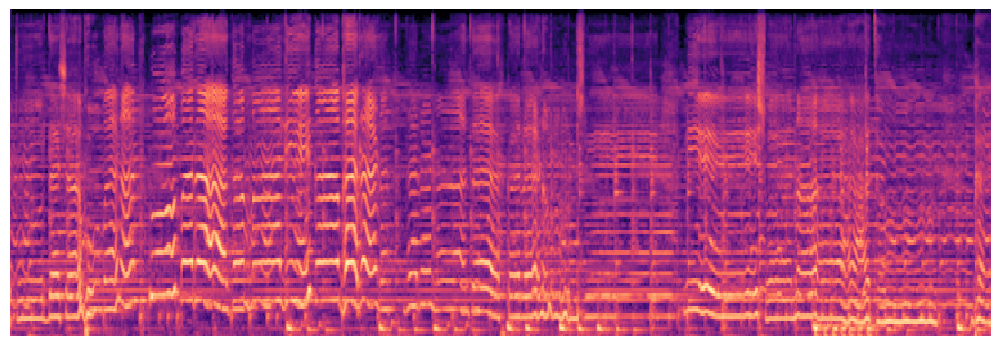

In [7]:
# Display melspectogram on logscale 

plt.figure(figsize=(15,5))
pylab.axis('off') # no axis
pylab.axes([0., 0., 1., 1.], frameon=False, xticks=[], yticks=[]) # Remove the white edge
S = librosa.feature.melspectrogram(y=y, sr=sr)
librosa.display.specshow(librosa.power_to_db(S, ref=np.max))
plt.savefig('../figures/spectrogram.jpg')
pylab.show()
pylab.close()

<Figure size 1080x360 with 0 Axes>

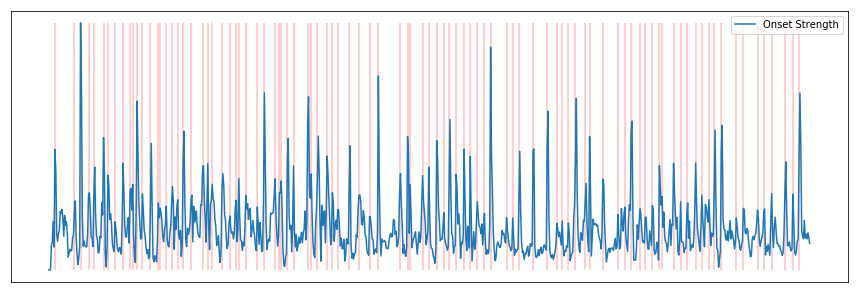

<Figure size 1080x360 with 0 Axes>

In [8]:
envelope = librosa.onset.onset_strength(y, sr)
onsets = librosa.onset.onset_detect(onset_envelope=envelope)
plt.figure(figsize=(15,5))
plt.plot(envelope, label='Onset Strength')
plt.vlines(onsets, 0, envelope.max(), colors='r', alpha=.25)
plt.xticks([], plt.yticks([]))
plt.legend(frameon=True)
plt.axis('tight')
plt.savefig('../figures/beatOnset.jpg')
plt.figure(figsize=(15,5))


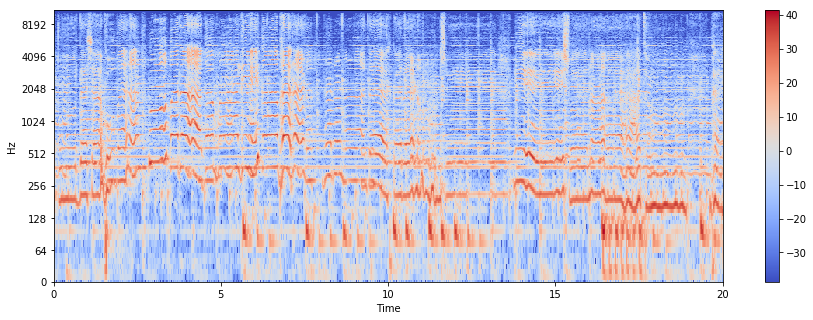

In [9]:
S = librosa.stft(y)

S_db = librosa.amplitude_to_db(abs(S))

plt.figure(figsize=(15, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log')
plt.colorbar()

In [10]:
# change number of components
X, phase = librosa.magphase(S)
nComponents = 6
W, H = librosa.decompose.decompose(X, n_components=nComponents, sort=True)

c:\users\lexokan\anaconda3\envs\tensorflow\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.


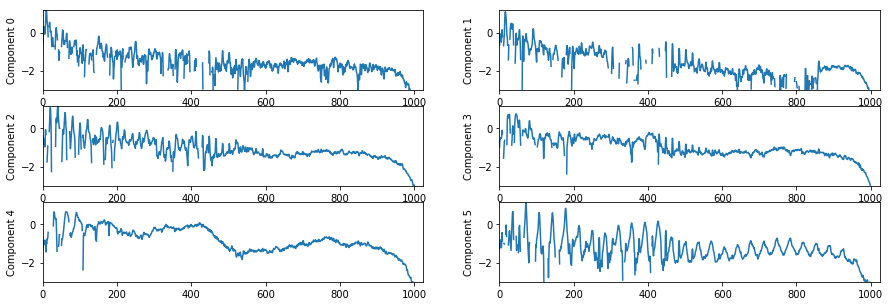

In [11]:
# Display spectral profiles 

plt.figure(figsize=(15, 5))
logW = np.log10(W)
for n in range(nComponents):
    plt.subplot(np.ceil(nComponents/2.0), 2, n+1)
    plt.plot(logW[:,n])
    plt.ylim(-3, logW.max())
    plt.xlim(0, W.shape[0])
    plt.ylabel('Component %d' % n)

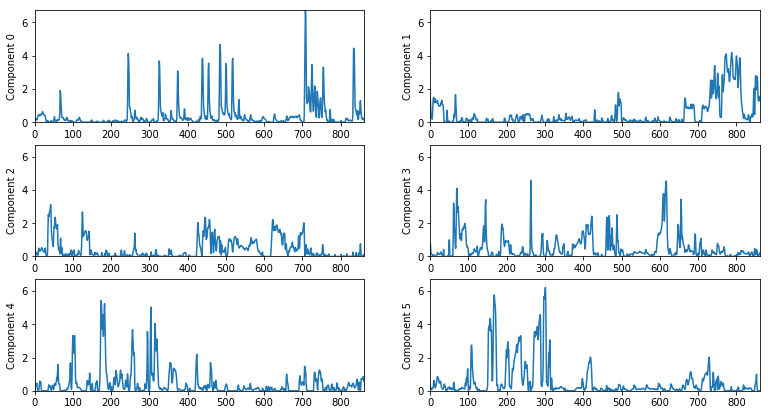

In [12]:
# Display temporal activations
plt.figure(figsize=(13, 7))
for n in range(nComponents):
    plt.subplot(np.ceil(nComponents/2.0), 2, n+1)
    plt.plot(H[n])
    plt.ylim(0, H.max())
    plt.xlim(0, H.shape[1])
    plt.ylabel('Component %d' % n)

In [13]:
# Re-create the indivdual components and listen to them
for n in range(nComponents):
    
    # Re-create the STFT of a single NMF component.
    Y = scipy.outer(W[:,n], H[n])*phase
    
    # Transform the STFT into the time domain.
    y = librosa.istft(Y)
    
    print('Component {}:'.format(n))
    ipd.display( ipd.Audio(y, rate=sr) )

Component 0:


Component 1:


Component 2:


Component 3:


Component 4:


Component 5:


In [14]:
# Re-create the STFT from all NMF components.
Y = np.dot(W, H)*phase

# Transform the STFT into the time domain.
reconstructed_signal = librosa.istft(Y, length=len(y))
ipd.Audio(reconstructed_signal, rate=sr)

In [15]:
# Original Signal
residual = y - reconstructed_signal
residual[0] = 1
ipd.Audio(residual, rate=sr)